Data Preprocessing + Exploration 

In [2]:
#for data wrangling 
import pandas as pd 
import numpy as np 
import re 
import string

#for visualization
import matplotlib.pyplot as plt
import matplotlib.dates as mdates 
import seaborn as sns 

#read the data frame 
df = pd.read_csv('cyber.csv', delimiter=',')
print(df)
print(df.shape)


                                              tweet_text cyberbullying_type
0      In other words #katandandre, your food was cra...  not_cyberbullying
1      Why is #aussietv so white? #MKR #theblock #ImA...  not_cyberbullying
2      @XochitlSuckkks a classy whore? Or more red ve...  not_cyberbullying
3      @Jason_Gio meh. :P  thanks for the heads up, b...  not_cyberbullying
4      @RudhoeEnglish This is an ISIS account pretend...  not_cyberbullying
...                                                  ...                ...
47687  Black ppl aren't expected to do anything, depe...          ethnicity
47688  Turner did not withhold his disappointment. Tu...          ethnicity
47689  I swear to God. This dumb nigger bitch. I have...          ethnicity
47690  Yea fuck you RT @therealexel: IF YOURE A NIGGE...          ethnicity
47691  Bro. U gotta chill RT @CHILLShrammy: Dog FUCK ...          ethnicity

[47692 rows x 2 columns]
(47692, 2)


In [3]:
#check if there's any missing values 
df.isnull().sum()

#no missing values 

tweet_text            0
cyberbullying_type    0
dtype: int64

In [4]:
#check if there are duplicates for tweet_text
df["tweet_text"].duplicated().sum()
df.drop_duplicates('tweet_text',inplace=True)


In [5]:
#determine the distribution of the values for each type of cyberbullying
type_count = df['cyberbullying_type'].value_counts()
print(type_count)


religion               7995
age                    7992
ethnicity              7952
not_cyberbullying      7937
gender                 7898
other_cyberbullying    6243
Name: cyberbullying_type, dtype: int64


([<matplotlib.patches.Wedge at 0x157351dc0>,
 [Text(0.9401716751322771, 0.5710317165262961, 'religion'),
  Text(-0.07305334382288999, 1.097571505167793, 'age'),
  Text(-1.006257603476582, 0.44434855175365, 'ethnicity'),
  Text(-0.8629465735382498, -0.6821460336457248, 'not_cyberbullying'),
  Text(0.19603985331832186, -1.0823901218650007, 'gender'),
  Text(1.0015924697943972, -0.45476645044589625, 'other_cyberbullying')],
 [Text(0.5128209137085147, 0.3114718453779797, '17.4%'),
  Text(-0.03984727844884908, 0.5986753664551597, '17.4%'),
  Text(-0.5488677837144992, 0.2423719373201727, '17.3%'),
  Text(-0.47069813102086344, -0.37207965471584986, '17.2%'),
  Text(0.106930829082721, -0.590394611926364, '17.2%'),
  Text(0.5463231653423984, -0.2480544275159434, '13.6%')])

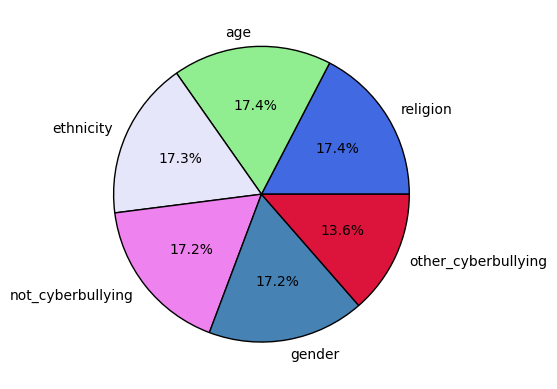

In [6]:
slices = type_count.values
#offset the second slice 
color = ['royalblue','lightgreen','lavender','violet','steelblue','crimson']
explode = [0,0.1,0]
plt.pie(slices,labels=type_count.index,colors=color, autopct='%1.1f%%',wedgeprops={'edgecolor':'black'})

The data is split evenly into ~17 percent each except for the other_cyberbullying, and age and religion have the most data --> valid for multicalss classification 

In [7]:
#remove links/pics/punc and etc for the NLP model 
string.punctuation

#create a function to remove the patterns  
def remove_pattern(text):
    clean_txt = re.sub(r'@\S+|http\S+|pic.\S+|\d+|[^a-zA-Z\']|\s+[a-zA-Z]\s+', ' ', text)
    return clean_txt

df['clean_tweet'] = df['tweet_text'].apply(lambda x: remove_pattern(x))
df.head()


,tweet_text,cyberbullying_type,clean_tweet
0,"In other words #katandandre, your food was cra...",not_cyberbullying,In other words katandandre your food was cra...
1,Why is #aussietv so white? #MKR #theblock #ImA...,not_cyberbullying,Why is aussietv so white MKR theblock ImA...
2,@XochitlSuckkks a classy whore? Or more red ve...,not_cyberbullying,a classy whore Or more red velvet cupcakes
3,"@Jason_Gio meh. :P thanks for the heads up, b...",not_cyberbullying,meh P thanks for the heads up but not to...
4,@RudhoeEnglish This is an ISIS account pretend...,not_cyberbullying,This is an ISIS account pretending to be a K...


In [8]:
#tokenize the strings by splitting into individual words 
def to_tokenize(text):
    sections = re.split("\W",text)
    return sections 

df['clean_tweet_token'] = df['clean_tweet'].apply(lambda x: to_tokenize(x.lower()) )
df.head()

,tweet_text,cyberbullying_type,clean_tweet,clean_tweet_token
0,"In other words #katandandre, your food was cra...",not_cyberbullying,In other words katandandre your food was cra...,"[in, other, words, , katandandre, , your, food..."
1,Why is #aussietv so white? #MKR #theblock #ImA...,not_cyberbullying,Why is aussietv so white MKR theblock ImA...,"[why, is, , aussietv, so, white, , , mkr, , th..."
2,@XochitlSuckkks a classy whore? Or more red ve...,not_cyberbullying,a classy whore Or more red velvet cupcakes,"[, , a, classy, whore, , or, more, red, velvet..."
3,"@Jason_Gio meh. :P thanks for the heads up, b...",not_cyberbullying,meh P thanks for the heads up but not to...,"[, , meh, , , p, , thanks, for, the, heads, up..."
4,@RudhoeEnglish This is an ISIS account pretend...,not_cyberbullying,This is an ISIS account pretending to be a K...,"[, , this, is, an, isis, account, pretending, ..."


In [9]:
#remove stop words 

#import the libraries 
import nltk 
nltk.download('stopwords')

#look at the type of stopwords there is 
stopword = nltk.corpus.stopwords.words('english')
print(stopword)

def remove_stopwords(text):
    text = [word for word in text if word not in stopword]
    return text 

df['clean_tweet_stopword'] = df['clean_tweet_token'].apply(lambda x: remove_stopwords(x))
df.head()


[nltk_data] Downloading package stopwords to /Users/jc/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', '

,tweet_text,cyberbullying_type,clean_tweet,clean_tweet_token,clean_tweet_stopword
0,"In other words #katandandre, your food was cra...",not_cyberbullying,In other words katandandre your food was cra...,"[in, other, words, , katandandre, , your, food...","[words, , katandandre, , food, crapilicious, ,..."
1,Why is #aussietv so white? #MKR #theblock #ImA...,not_cyberbullying,Why is aussietv so white MKR theblock ImA...,"[why, is, , aussietv, so, white, , , mkr, , th...","[, aussietv, white, , , mkr, , theblock, , ima..."
2,@XochitlSuckkks a classy whore? Or more red ve...,not_cyberbullying,a classy whore Or more red velvet cupcakes,"[, , a, classy, whore, , or, more, red, velvet...","[, , classy, whore, , red, velvet, cupcakes, ]"
3,"@Jason_Gio meh. :P thanks for the heads up, b...",not_cyberbullying,meh P thanks for the heads up but not to...,"[, , meh, , , p, , thanks, for, the, heads, up...","[, , meh, , , p, , thanks, heads, , concerned,..."
4,@RudhoeEnglish This is an ISIS account pretend...,not_cyberbullying,This is an ISIS account pretending to be a K...,"[, , this, is, an, isis, account, pretending, ...","[, , isis, account, pretending, kurdish, accou..."


In [10]:
#identify the words with their part of speech
from nltk.tag import pos_tag
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')

df['tweet_speech'] = df['clean_tweet_stopword'].apply(nltk.tag.pos_tag)
df.head()


[nltk_data] Downloading package punkt to /Users/jc/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /Users/jc/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


,tweet_text,cyberbullying_type,clean_tweet,clean_tweet_token,clean_tweet_stopword,tweet_speech
0,"In other words #katandandre, your food was cra...",not_cyberbullying,In other words katandandre your food was cra...,"[in, other, words, , katandandre, , your, food...","[words, , katandandre, , food, crapilicious, ,...","[(words, NNS), (, VBP), (katandandre, JJ), (, ..."
1,Why is #aussietv so white? #MKR #theblock #ImA...,not_cyberbullying,Why is aussietv so white MKR theblock ImA...,"[why, is, , aussietv, so, white, , , mkr, , th...","[, aussietv, white, , , mkr, , theblock, , ima...","[(, JJ), (aussietv, JJ), (white, JJ), (, NN), ..."
2,@XochitlSuckkks a classy whore? Or more red ve...,not_cyberbullying,a classy whore Or more red velvet cupcakes,"[, , a, classy, whore, , or, more, red, velvet...","[, , classy, whore, , red, velvet, cupcakes, ]","[(, JJ), (, NNP), (classy, NN), (whore, NN), (..."
3,"@Jason_Gio meh. :P thanks for the heads up, b...",not_cyberbullying,meh P thanks for the heads up but not to...,"[, , meh, , , p, , thanks, for, the, heads, up...","[, , meh, , , p, , thanks, heads, , concerned,...","[(, JJ), (, NNP), (meh, NN), (, NNP), (, NNP),..."
4,@RudhoeEnglish This is an ISIS account pretend...,not_cyberbullying,This is an ISIS account pretending to be a K...,"[, , this, is, an, isis, account, pretending, ...","[, , isis, account, pretending, kurdish, accou...","[(, JJ), (, JJ), (isis, NN), (account, NN), (p..."


In [11]:
#create a function to classify the words into verb, noun, etc 
from nltk.corpus import wordnet
nltk.download('wordnet')

def get_wordnet_pos(tag):
    if tag.startswith('J'):
        return wordnet.ADJ
    elif tag.startswith('V'):
        return wordnet.VERB
    elif tag.startswith('N'):
        return wordnet.NOUN
    elif tag.startswith('R'):
        return wordnet.ADV
    else:
        return wordnet.NOUN

df['tweet_wordnet'] = df['tweet_speech'].apply(lambda x: [(word, get_wordnet_pos(pos_tag)) for (word, pos_tag) in x])
df.head()

[nltk_data] Downloading package wordnet to /Users/jc/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


,tweet_text,cyberbullying_type,clean_tweet,clean_tweet_token,clean_tweet_stopword,tweet_speech,tweet_wordnet
0,"In other words #katandandre, your food was cra...",not_cyberbullying,In other words katandandre your food was cra...,"[in, other, words, , katandandre, , your, food...","[words, , katandandre, , food, crapilicious, ,...","[(words, NNS), (, VBP), (katandandre, JJ), (, ...","[(words, n), (, v), (katandandre, a), (, n), (..."
1,Why is #aussietv so white? #MKR #theblock #ImA...,not_cyberbullying,Why is aussietv so white MKR theblock ImA...,"[why, is, , aussietv, so, white, , , mkr, , th...","[, aussietv, white, , , mkr, , theblock, , ima...","[(, JJ), (aussietv, JJ), (white, JJ), (, NN), ...","[(, a), (aussietv, a), (white, a), (, n), (, n..."
2,@XochitlSuckkks a classy whore? Or more red ve...,not_cyberbullying,a classy whore Or more red velvet cupcakes,"[, , a, classy, whore, , or, more, red, velvet...","[, , classy, whore, , red, velvet, cupcakes, ]","[(, JJ), (, NNP), (classy, NN), (whore, NN), (...","[(, a), (, n), (classy, n), (whore, n), (, n),..."
3,"@Jason_Gio meh. :P thanks for the heads up, b...",not_cyberbullying,meh P thanks for the heads up but not to...,"[, , meh, , , p, , thanks, for, the, heads, up...","[, , meh, , , p, , thanks, heads, , concerned,...","[(, JJ), (, NNP), (meh, NN), (, NNP), (, NNP),...","[(, a), (, n), (meh, n), (, n), (, n), (p, n),..."
4,@RudhoeEnglish This is an ISIS account pretend...,not_cyberbullying,This is an ISIS account pretending to be a K...,"[, , this, is, an, isis, account, pretending, ...","[, , isis, account, pretending, kurdish, accou...","[(, JJ), (, JJ), (isis, NN), (account, NN), (p...","[(, a), (, a), (isis, n), (account, n), (prete..."


In [12]:
#lemmatize the word for
from nltk.stem import WordNetLemmatizer

lem = WordNetLemmatizer()
df['tweet_lemantize'] = df['tweet_wordnet'].apply(lambda x:[lem.lemmatize(word, tag) for word, tag in x])
df.head()

,tweet_text,cyberbullying_type,clean_tweet,clean_tweet_token,clean_tweet_stopword,tweet_speech,tweet_wordnet,tweet_lemantize
0,"In other words #katandandre, your food was cra...",not_cyberbullying,In other words katandandre your food was cra...,"[in, other, words, , katandandre, , your, food...","[words, , katandandre, , food, crapilicious, ,...","[(words, NNS), (, VBP), (katandandre, JJ), (, ...","[(words, n), (, v), (katandandre, a), (, n), (...","[word, , katandandre, , food, crapilicious, , ..."
1,Why is #aussietv so white? #MKR #theblock #ImA...,not_cyberbullying,Why is aussietv so white MKR theblock ImA...,"[why, is, , aussietv, so, white, , , mkr, , th...","[, aussietv, white, , , mkr, , theblock, , ima...","[(, JJ), (aussietv, JJ), (white, JJ), (, NN), ...","[(, a), (aussietv, a), (white, a), (, n), (, n...","[, aussietv, white, , , mkr, , theblock, , ima..."
2,@XochitlSuckkks a classy whore? Or more red ve...,not_cyberbullying,a classy whore Or more red velvet cupcakes,"[, , a, classy, whore, , or, more, red, velvet...","[, , classy, whore, , red, velvet, cupcakes, ]","[(, JJ), (, NNP), (classy, NN), (whore, NN), (...","[(, a), (, n), (classy, n), (whore, n), (, n),...","[, , classy, whore, , red, velvet, cupcake, ]"
3,"@Jason_Gio meh. :P thanks for the heads up, b...",not_cyberbullying,meh P thanks for the heads up but not to...,"[, , meh, , , p, , thanks, for, the, heads, up...","[, , meh, , , p, , thanks, heads, , concerned,...","[(, JJ), (, NNP), (meh, NN), (, NNP), (, NNP),...","[(, a), (, n), (meh, n), (, n), (, n), (p, n),...","[, , meh, , , p, , thanks, head, , concern, an..."
4,@RudhoeEnglish This is an ISIS account pretend...,not_cyberbullying,This is an ISIS account pretending to be a K...,"[, , this, is, an, isis, account, pretending, ...","[, , isis, account, pretending, kurdish, accou...","[(, JJ), (, JJ), (isis, NN), (account, NN), (p...","[(, a), (, a), (isis, n), (account, n), (prete...","[, , isi, account, pretend, kurdish, account, ..."


In [13]:
#transfer the lemantize column into strings for sentiment analysis 
df['lemma_str'] = [' '.join(map(str,l)) for l in df['tweet_lemantize']]
df.head()


,tweet_text,cyberbullying_type,clean_tweet,clean_tweet_token,clean_tweet_stopword,tweet_speech,tweet_wordnet,tweet_lemantize,lemma_str
0,"In other words #katandandre, your food was cra...",not_cyberbullying,In other words katandandre your food was cra...,"[in, other, words, , katandandre, , your, food...","[words, , katandandre, , food, crapilicious, ,...","[(words, NNS), (, VBP), (katandandre, JJ), (, ...","[(words, n), (, v), (katandandre, a), (, n), (...","[word, , katandandre, , food, crapilicious, , ...",word katandandre food crapilicious mkr
1,Why is #aussietv so white? #MKR #theblock #ImA...,not_cyberbullying,Why is aussietv so white MKR theblock ImA...,"[why, is, , aussietv, so, white, , , mkr, , th...","[, aussietv, white, , , mkr, , theblock, , ima...","[(, JJ), (aussietv, JJ), (white, JJ), (, NN), ...","[(, a), (aussietv, a), (white, a), (, n), (, n...","[, aussietv, white, , , mkr, , theblock, , ima...",aussietv white mkr theblock imacelebritya...
2,@XochitlSuckkks a classy whore? Or more red ve...,not_cyberbullying,a classy whore Or more red velvet cupcakes,"[, , a, classy, whore, , or, more, red, velvet...","[, , classy, whore, , red, velvet, cupcakes, ]","[(, JJ), (, NNP), (classy, NN), (whore, NN), (...","[(, a), (, n), (classy, n), (whore, n), (, n),...","[, , classy, whore, , red, velvet, cupcake, ]",classy whore red velvet cupcake
3,"@Jason_Gio meh. :P thanks for the heads up, b...",not_cyberbullying,meh P thanks for the heads up but not to...,"[, , meh, , , p, , thanks, for, the, heads, up...","[, , meh, , , p, , thanks, heads, , concerned,...","[(, JJ), (, NNP), (meh, NN), (, NNP), (, NNP),...","[(, a), (, n), (meh, n), (, n), (, n), (p, n),...","[, , meh, , , p, , thanks, head, , concern, an...",meh p thanks head concern another angry ...
4,@RudhoeEnglish This is an ISIS account pretend...,not_cyberbullying,This is an ISIS account pretending to be a K...,"[, , this, is, an, isis, account, pretending, ...","[, , isis, account, pretending, kurdish, accou...","[(, JJ), (, JJ), (isis, NN), (account, NN), (p...","[(, a), (, a), (isis, n), (account, n), (prete...","[, , isi, account, pretend, kurdish, account, ...",isi account pretend kurdish account like i...


In [14]:
#obtain the sentiment of the text
from textblob import TextBlob
df['sentiment'] = df['lemma_str'].apply(lambda x: TextBlob(x).sentiment.polarity)
df.head()


,tweet_text,cyberbullying_type,clean_tweet,clean_tweet_token,clean_tweet_stopword,tweet_speech,tweet_wordnet,tweet_lemantize,lemma_str,sentiment
0,"In other words #katandandre, your food was cra...",not_cyberbullying,In other words katandandre your food was cra...,"[in, other, words, , katandandre, , your, food...","[words, , katandandre, , food, crapilicious, ,...","[(words, NNS), (, VBP), (katandandre, JJ), (, ...","[(words, n), (, v), (katandandre, a), (, n), (...","[word, , katandandre, , food, crapilicious, , ...",word katandandre food crapilicious mkr,0.00
1,Why is #aussietv so white? #MKR #theblock #ImA...,not_cyberbullying,Why is aussietv so white MKR theblock ImA...,"[why, is, , aussietv, so, white, , , mkr, , th...","[, aussietv, white, , , mkr, , theblock, , ima...","[(, JJ), (aussietv, JJ), (white, JJ), (, NN), ...","[(, a), (aussietv, a), (white, a), (, n), (, n...","[, aussietv, white, , , mkr, , theblock, , ima...",aussietv white mkr theblock imacelebritya...,0.00
2,@XochitlSuckkks a classy whore? Or more red ve...,not_cyberbullying,a classy whore Or more red velvet cupcakes,"[, , a, classy, whore, , or, more, red, velvet...","[, , classy, whore, , red, velvet, cupcakes, ]","[(, JJ), (, NNP), (classy, NN), (whore, NN), (...","[(, a), (, n), (classy, n), (whore, n), (, n),...","[, , classy, whore, , red, velvet, cupcake, ]",classy whore red velvet cupcake,0.05
3,"@Jason_Gio meh. :P thanks for the heads up, b...",not_cyberbullying,meh P thanks for the heads up but not to...,"[, , meh, , , p, , thanks, for, the, heads, up...","[, , meh, , , p, , thanks, heads, , concerned,...","[(, JJ), (, NNP), (meh, NN), (, NNP), (, NNP),...","[(, a), (, n), (meh, n), (, n), (, n), (p, n),...","[, , meh, , , p, , thanks, head, , concern, an...",meh p thanks head concern another angry ...,-0.15
4,@RudhoeEnglish This is an ISIS account pretend...,not_cyberbullying,This is an ISIS account pretending to be a K...,"[, , this, is, an, isis, account, pretending, ...","[, , isis, account, pretending, kurdish, accou...","[(, JJ), (, JJ), (isis, NN), (account, NN), (p...","[(, a), (, a), (isis, n), (account, n), (prete...","[, , isi, account, pretend, kurdish, account, ...",isi account pretend kurdish account like i...,0.00


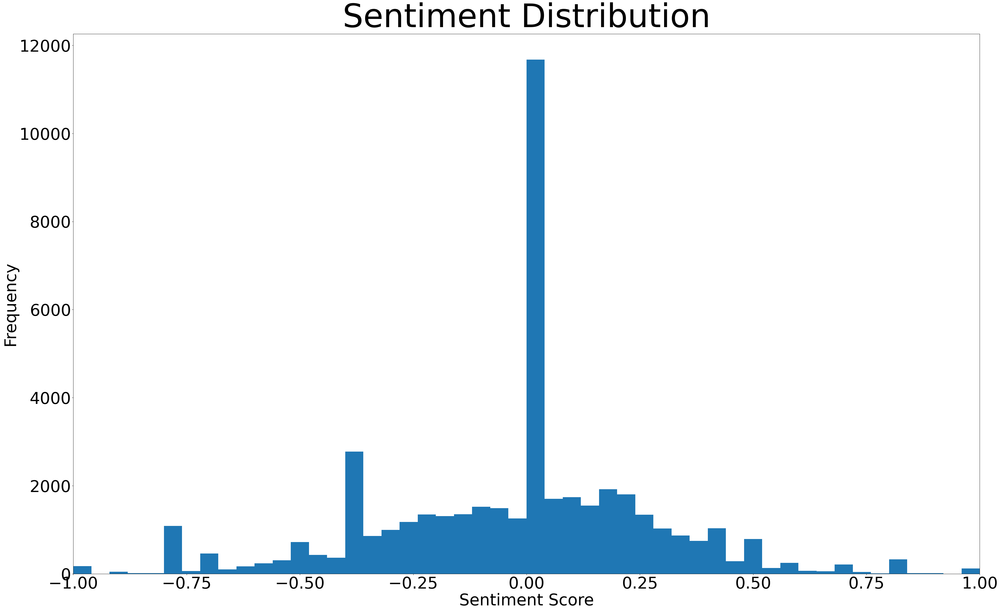

In [15]:
#create a plot to gain a overview of the sentiment distribution
plt.figure(figsize=(50,30))
plt.title('Sentiment Distribution', fontsize=100)
plt.xlabel('Sentiment Score', fontsize=50)
plt.xticks(fontsize=50)
plt.ylabel('Frequency', fontsize=50)
plt.yticks(fontsize=50)
plt.xlim(-1,1)

#create the histogram w/ 50 bins 
plt.hist(df['sentiment'], bins=50)
plt.show()

In [16]:
#display the top 100 common words for overall cyberbullying/not_cyberbullying
from nltk.probability import FreqDist
from wordcloud import WordCloud

def wordcloud(data):
    words = df.loc[df['cyberbullying_type'] == data, 'tweet_lemantize']
    allwords = []
    for wordlist in words:
        allwords += wordlist

    mostcommon = FreqDist(allwords).most_common(100)
    wordcloud = WordCloud(width=2000, height=1000, background_color='white').generate(str(mostcommon))
    plt.figure(figsize=(30,30), facecolor='white')
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis('off')
    plt.title(f'Top 100 Most Common Words for {data} type', fontsize=85)
    plt.tight_layout(pad=0)
    plt.show()

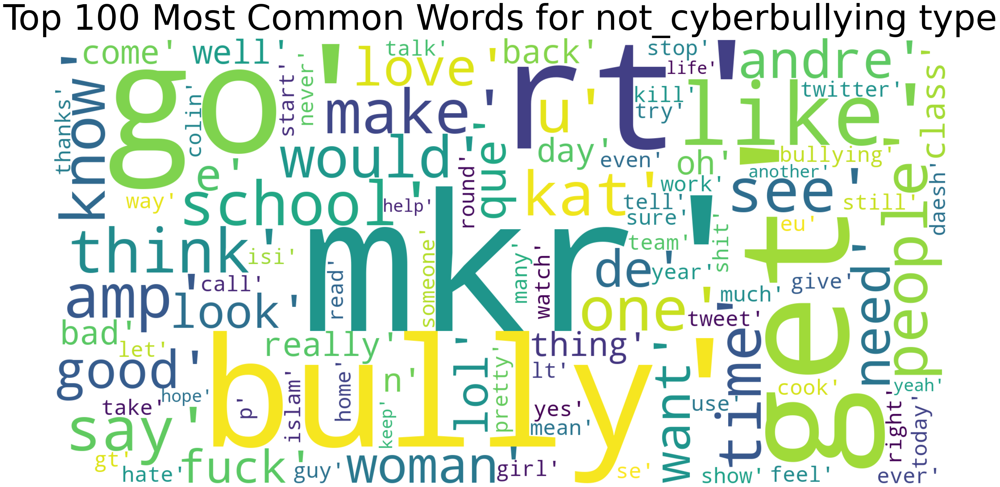

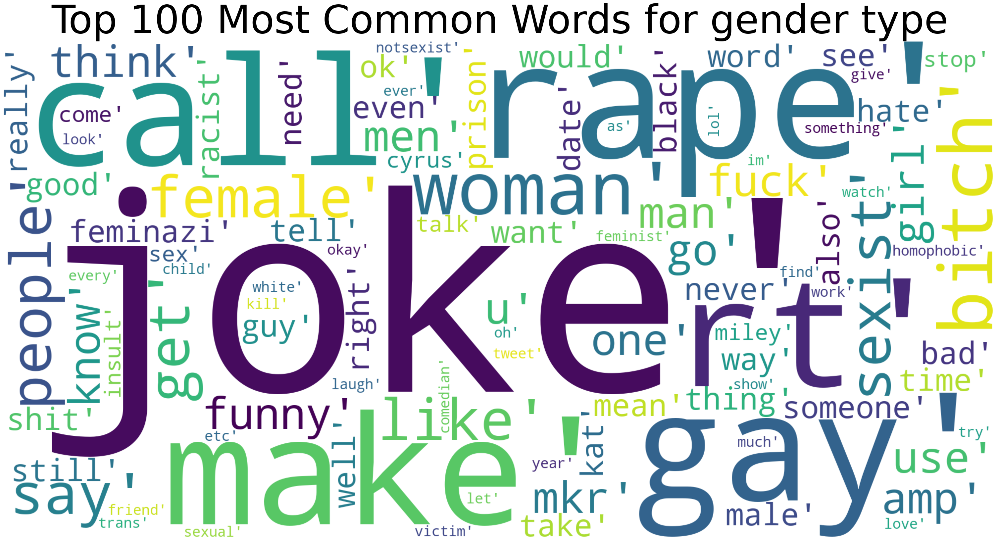

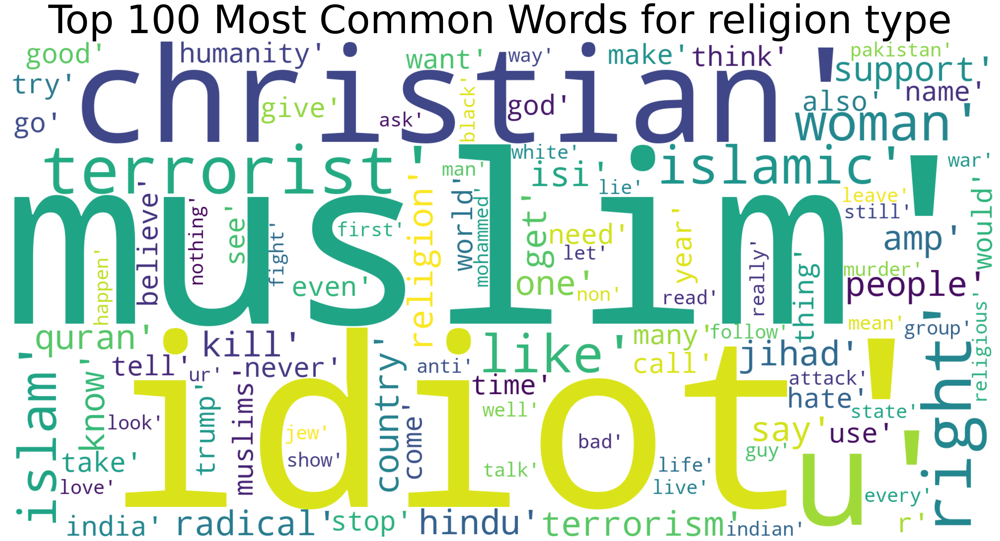

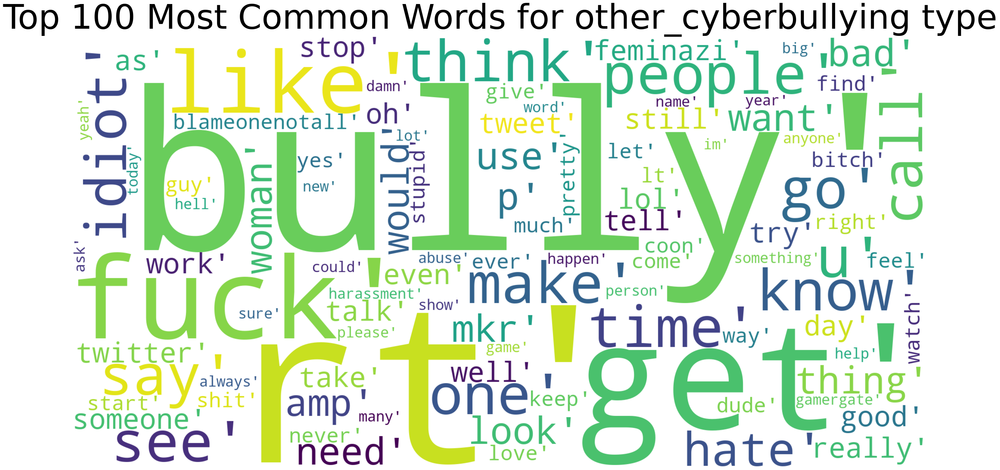

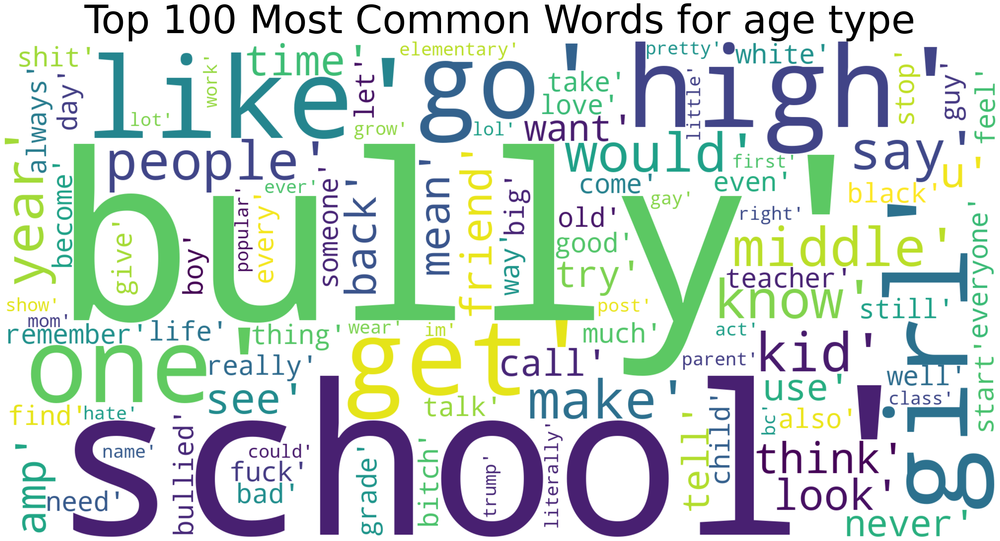

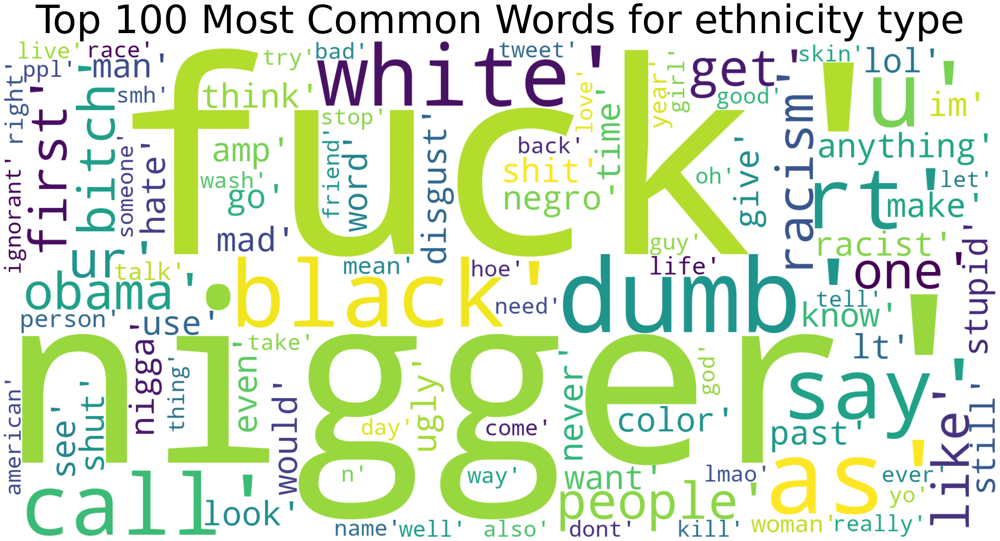

In [17]:
#plot the wordcloud for each of the cyberbullying type 
for type in df['cyberbullying_type'].unique(): 
    wordcloud(type)

In [18]:
#attempt to categorize other_cyberbullying 
from collections import Counter

#obtain the other_cyberbullying from the df and combine into a single string
other_cyberbullying = df[df['cyberbullying_type'] == 'other_cyberbullying']['lemma_str']
other_cyberbullying_combined_text = ' '.join(other_cyberbullying)
other_cyberbullying_words = other_cyberbullying_combined_text.split()

#use counter to count the words in other_cyberbullying words
others_counts = Counter(other_cyberbullying_words)
others_common_words = others_counts.most_common(50) 

#use a for loop to get the 50 most common words
for word in others_common_words:
    print(f'Word: {word}')

#the words seem like a combination of the other types - discriminatory/appearance


Word: ('bully', 885)
Word: ('rt', 750)
Word: ('get', 554)
Word: ('fuck', 482)
Word: ('like', 417)
Word: ('people', 354)
Word: ('go', 342)
Word: ('make', 275)
Word: ('think', 275)
Word: ('know', 267)
Word: ('idiot', 258)
Word: ('u', 233)
Word: ('see', 217)
Word: ('say', 214)
Word: ('one', 209)
Word: ('time', 205)
Word: ('call', 185)
Word: ('hate', 185)
Word: ('thing', 184)
Word: ('want', 183)
Word: ('bad', 182)
Word: ('need', 181)
Word: ('would', 176)
Word: ('mkr', 173)
Word: ('use', 167)
Word: ('amp', 163)
Word: ('p', 161)
Word: ('look', 159)
Word: ('woman', 156)
Word: ('feminazi', 153)
Word: ('lol', 151)
Word: ('talk', 147)
Word: ('good', 142)
Word: ('really', 141)
Word: ('twitter', 140)
Word: ('as', 128)
Word: ('tweet', 128)
Word: ('still', 125)
Word: ('someone', 125)
Word: ('even', 124)
Word: ('work', 123)
Word: ('try', 121)
Word: ('tell', 120)
Word: ('stop', 120)
Word: ('take', 119)
Word: ('oh', 117)
Word: ('well', 115)
Word: ('day', 110)
Word: ('blameonenotall', 109)
Word: ('never

Multiclass Classification (Naive Bayes/Random Forest/Gradient Boosting)

In [19]:
#import the require libraries 
from sklearn.preprocessing import LabelEncoder
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.svm import SVC
from sklearn.naive_bayes import MultinomialNB
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.metrics import classification_report
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix,precision_recall_curve





In [20]:
#encode the categorical value into numerical values 
encoder = LabelEncoder()
df['cyber_encode'] = encoder.fit_transform(df['cyberbullying_type'])
print(df['cyber_encode'])

0        3
1        3
2        3
3        3
4        3
        ..
47687    1
47688    1
47689    1
47690    1
47691    1
Name: cyber_encode, Length: 46017, dtype: int64


In [21]:
#create train test split  
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(df['lemma_str'], df['cyber_encode'], test_size=0.2, random_state=42)


In [22]:
#convert lemmantize data into numerical feature 
vectorizer = TfidfVectorizer()
X_train_vector = vectorizer.fit_transform(X_train)
X_test_vector = vectorizer.transform(X_test)




In [23]:
#create the naive bayes model
multi_model = MultinomialNB()

#define the hyperparameter 
param_grid = {
    'alpha': [0.1, 0.5, 1.0],
    'fit_prior': [True, False]
}

#perform cross validation with grid search
multi_search = GridSearchCV(multi_model, param_grid, cv=5)
multi_search.fit(X_train_vector, y_train)

GridSearchCV(cv=5, estimator=MultinomialNB(),
             param_grid={'alpha': [0.1, 0.5, 1.0], 'fit_prior': [True, False]})

In [24]:
#obtain the best parameter and the best model 
multi_best_params = multi_search.best_params_
multi_best_model = multi_search.best_estimator_

#predict the model
y_pred = multi_best_model.predict(X_test_vector)

#evaluate the performance of the model through report 
print(f'Naive Bayes Model Report ')
print(classification_report(y_test,y_pred))

Naive Bayes Model Report 
              precision    recall  f1-score   support

           0       0.67      0.97      0.79      1545
           1       0.83      0.91      0.87      1635
           2       0.80      0.83      0.82      1548
           3       0.71      0.39      0.51      1638
           4       0.58      0.34      0.43      1267
           5       0.79      0.96      0.87      1571

    accuracy                           0.75      9204
   macro avg       0.73      0.74      0.71      9204
weighted avg       0.74      0.75      0.72      9204



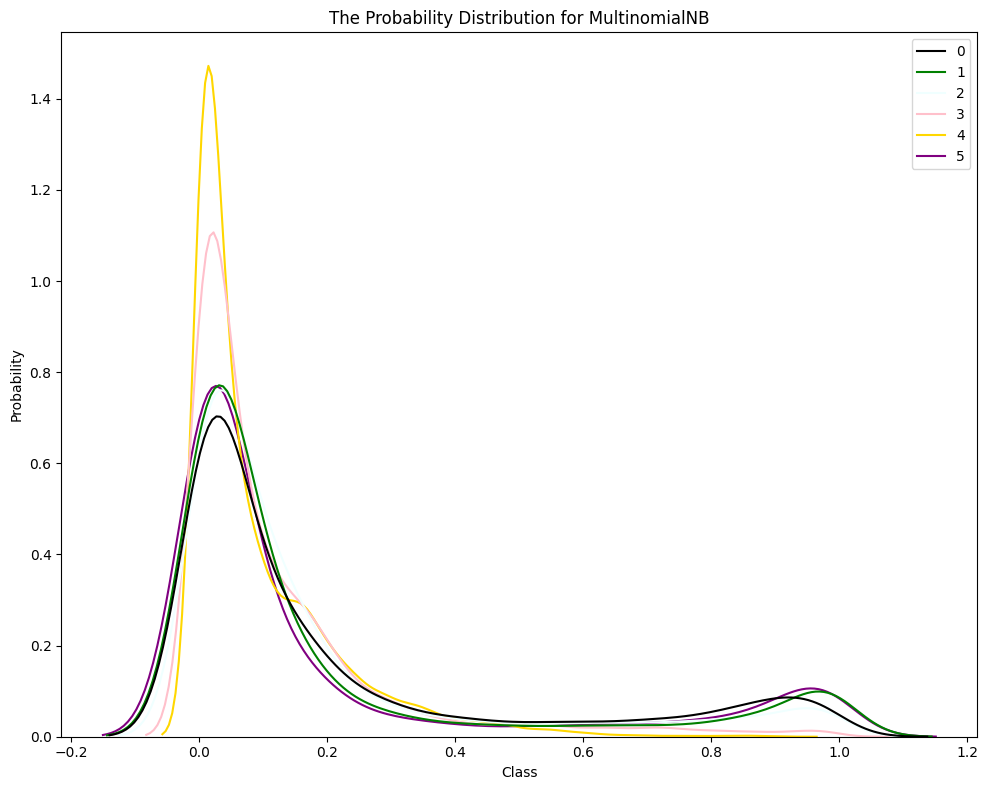

In [25]:
#create a probability distribution for the naive bayes model 
multi_prob_dist = multi_best_model.predict_proba(X_test_vector)

color = ['black','green','azure','pink','gold','purple']

#plot the probability distribution 
plt.figure(figsize=(10, 8))
sns.kdeplot(data=multi_prob_dist, palette=color)
plt.title('The Probability Distribution for MultinomialNB')
plt.xlabel('Class')
plt.ylabel('Probability')
plt.tight_layout()
plt.show()

In [26]:
#create the random forest model and fit to training data 
rf_model = RandomForestClassifier()
rf_model.fit(X_train_vector, y_train)

#predict the labels for testing data 
y_pred = rf_model.predict(X_test_vector)

#evaluate the performance of the model through report 
print(f'Random Forest Model Report ')
print(classification_report(y_test,y_pred))

Random Forest Model Report 
              precision    recall  f1-score   support

           0       0.96      0.98      0.97      1545
           1       0.99      0.99      0.99      1635
           2       0.90      0.86      0.88      1548
           3       0.63      0.64      0.63      1638
           4       0.58      0.60      0.59      1267
           5       0.95      0.96      0.96      1571

    accuracy                           0.84      9204
   macro avg       0.84      0.84      0.84      9204
weighted avg       0.85      0.84      0.84      9204



/Users/jc/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


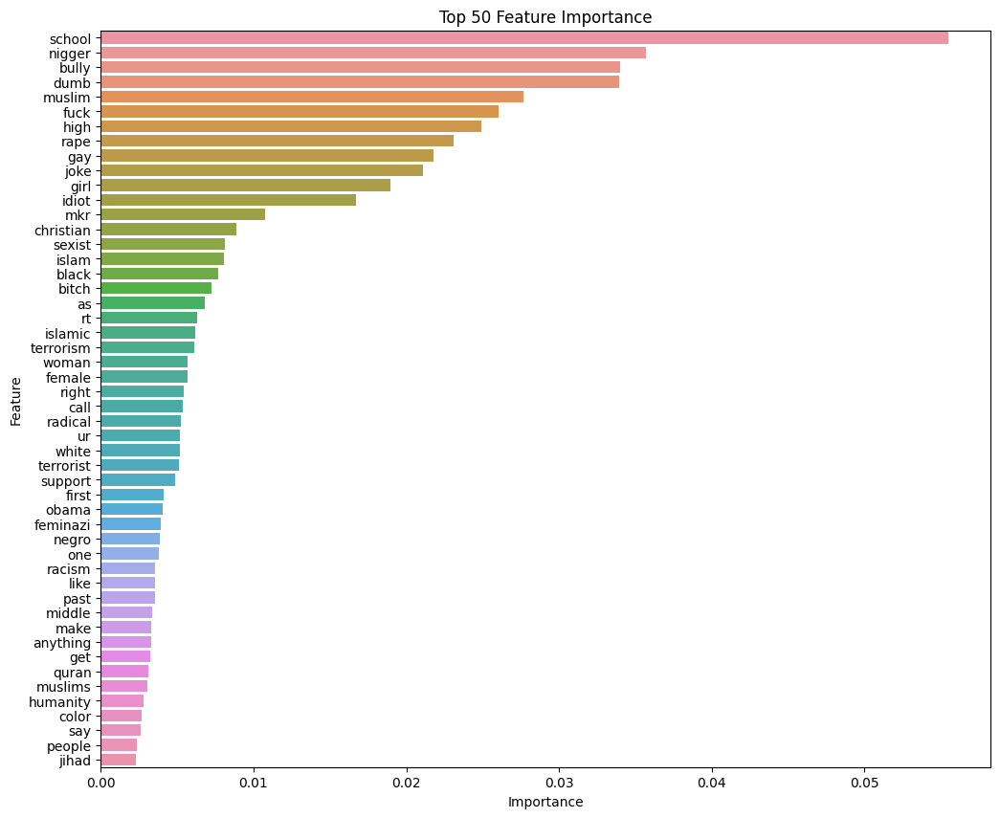

In [27]:
#determine the feature importances of the rf_model
rf_features = rf_model.feature_importances_

#create a new df that consist of the feature and their importance scores 
rf_importances = pd.DataFrame({'Feature': vectorizer.get_feature_names(), 'Importance': rf_features})
rf_importances = rf_importances.sort_values(by='Importance', ascending=False)

#plot the top 50 words 
plt.figure(figsize=(12, 10))
sns.barplot(x='Importance', y='Feature', data=rf_importances[:50])
plt.title(f'Top {50} Feature Importance')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

In [28]:
#create the Gradient Boosting model and fit to training data
gradient_model = GradientBoostingClassifier()
gradient_model.fit(X_train_vector, y_train)

#predict the labels for testing data 
y_pred = gradient_model.predict(X_test_vector)

#evaluate the performance of the model through report 
print(f'Gradient Boosting Model Report ')
print(classification_report(y_test,y_pred))

Gradient Boosting Model Report 
              precision    recall  f1-score   support

           0       0.98      0.97      0.97      1545
           1       1.00      0.98      0.99      1635
           2       0.92      0.85      0.88      1548
           3       0.57      0.77      0.65      1638
           4       0.60      0.43      0.50      1267
           5       0.96      0.93      0.95      1571

    accuracy                           0.83      9204
   macro avg       0.84      0.82      0.82      9204
weighted avg       0.84      0.83      0.83      9204



/Users/jc/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


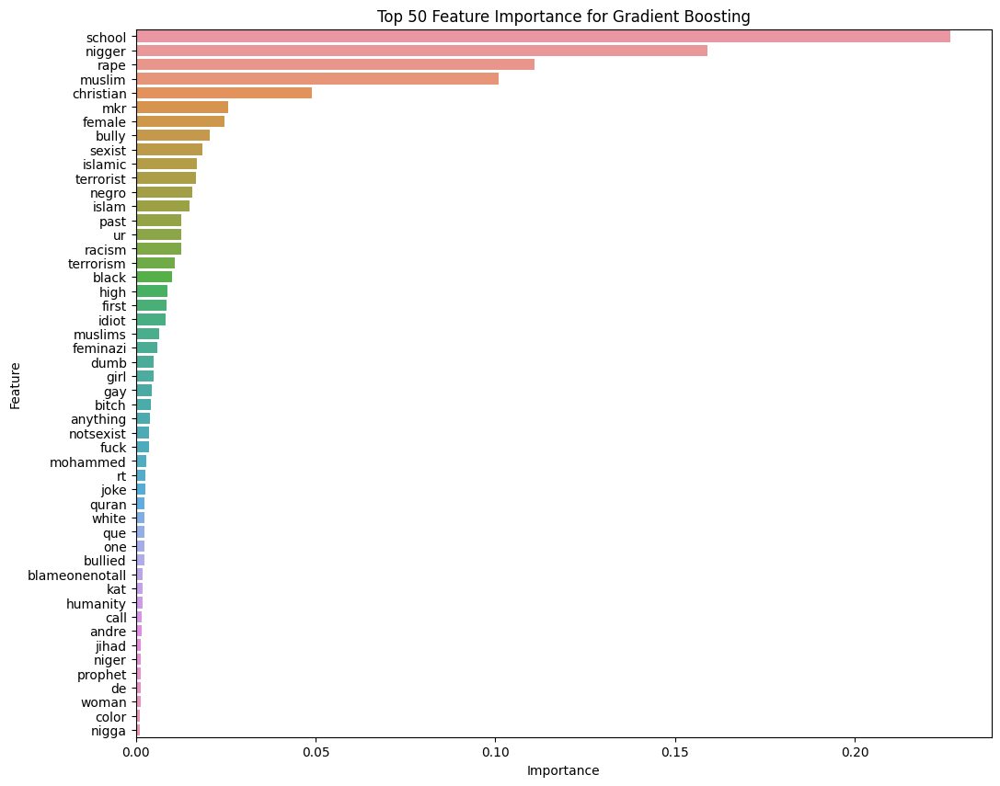

In [29]:
#obtain the feature importances for gradient_model
gradient_feature = gradient_model.feature_importances_

#create the dataframe with the features and their importance
gradient_importance = pd.DataFrame({'Feature': vectorizer.get_feature_names(), 'Importance': gradient_feature})
gradient_importance = gradient_importance.sort_values(by='Importance', ascending=False)


#plot the top 50 words
plt.figure(figsize=(12, 10))
sns.barplot(x='Importance', y='Feature', data=gradient_importance[:50])
plt.title(f'Top {50} Feature Importance for Gradient Boosting')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

Binary Classification (SVM, Logistic Regression)

In [30]:
#divide the dataset into cyberbullying and not_cyberbullying
def split_data(row):
    cyberbullying = ['religion','age','gender','other_cyberbullying','ethnicity']
    if row['cyberbullying_type'] in cyberbullying:
        return 1 
    else:
        return 0
    
#apply the function and check if it successful
df['binary_encode'] = df.apply(split_data,axis=1)
df.head()


,tweet_text,cyberbullying_type,clean_tweet,clean_tweet_token,clean_tweet_stopword,tweet_speech,tweet_wordnet,tweet_lemantize,lemma_str,sentiment,cyber_encode,binary_encode
0,"In other words #katandandre, your food was cra...",not_cyberbullying,In other words katandandre your food was cra...,"[in, other, words, , katandandre, , your, food...","[words, , katandandre, , food, crapilicious, ,...","[(words, NNS), (, VBP), (katandandre, JJ), (, ...","[(words, n), (, v), (katandandre, a), (, n), (...","[word, , katandandre, , food, crapilicious, , ...",word katandandre food crapilicious mkr,0.00,3,0
1,Why is #aussietv so white? #MKR #theblock #ImA...,not_cyberbullying,Why is aussietv so white MKR theblock ImA...,"[why, is, , aussietv, so, white, , , mkr, , th...","[, aussietv, white, , , mkr, , theblock, , ima...","[(, JJ), (aussietv, JJ), (white, JJ), (, NN), ...","[(, a), (aussietv, a), (white, a), (, n), (, n...","[, aussietv, white, , , mkr, , theblock, , ima...",aussietv white mkr theblock imacelebritya...,0.00,3,0
2,@XochitlSuckkks a classy whore? Or more red ve...,not_cyberbullying,a classy whore Or more red velvet cupcakes,"[, , a, classy, whore, , or, more, red, velvet...","[, , classy, whore, , red, velvet, cupcakes, ]","[(, JJ), (, NNP), (classy, NN), (whore, NN), (...","[(, a), (, n), (classy, n), (whore, n), (, n),...","[, , classy, whore, , red, velvet, cupcake, ]",classy whore red velvet cupcake,0.05,3,0
3,"@Jason_Gio meh. :P thanks for the heads up, b...",not_cyberbullying,meh P thanks for the heads up but not to...,"[, , meh, , , p, , thanks, for, the, heads, up...","[, , meh, , , p, , thanks, heads, , concerned,...","[(, JJ), (, NNP), (meh, NN), (, NNP), (, NNP),...","[(, a), (, n), (meh, n), (, n), (, n), (p, n),...","[, , meh, , , p, , thanks, head, , concern, an...",meh p thanks head concern another angry ...,-0.15,3,0
4,@RudhoeEnglish This is an ISIS account pretend...,not_cyberbullying,This is an ISIS account pretending to be a K...,"[, , this, is, an, isis, account, pretending, ...","[, , isis, account, pretending, kurdish, accou...","[(, JJ), (, JJ), (isis, NN), (account, NN), (p...","[(, a), (, a), (isis, n), (account, n), (prete...","[, , isi, account, pretend, kurdish, account, ...",isi account pretend kurdish account like i...,0.00,3,0


In [31]:
#split data into training and testing set
X_train_binary, X_test_binary, y_train_binary, y_test_binary = train_test_split(df['lemma_str'], df['binary_encode'], test_size=0.2, random_state=42)

#convert the feature into numerical values  
vectorizer = TfidfVectorizer()
X_train_vector_bin = vectorizer.fit_transform(X_train_binary)
X_test_vector_bin = vectorizer.transform(X_test_binary)




In [32]:
#create the svm_model model and fit to training data
svm_model = SVC()
svm_model.fit(X_train_vector_bin, y_train_binary)

#predict the label for testing data
svm_model_y_pred = svm_model.predict(X_test_vector_bin)

#evaluate the performance of the model through report 
print(f'svm_model Model Report ')
print(classification_report(y_test_binary,svm_model_y_pred))


svm_model Model Report 
              precision    recall  f1-score   support

           0       0.78      0.38      0.51      1638
           1       0.88      0.98      0.92      7566

    accuracy                           0.87      9204
   macro avg       0.83      0.68      0.72      9204
weighted avg       0.86      0.87      0.85      9204



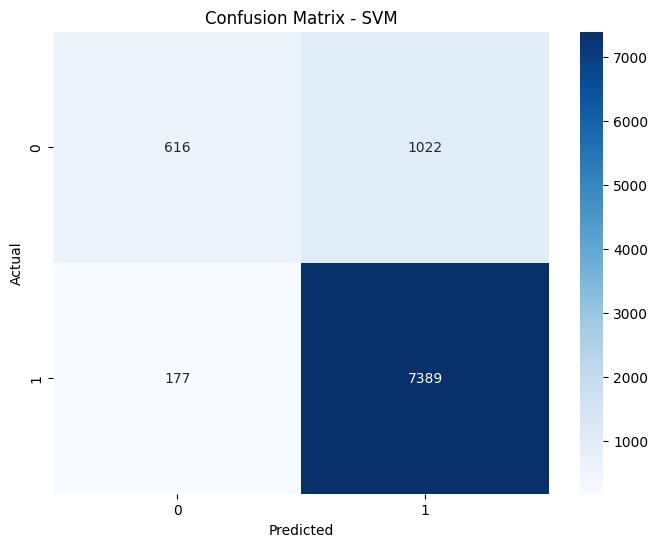

In [33]:
# Confusion Matrix
confusion = confusion_matrix(y_test_binary, svm_model_y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(confusion, annot=True, cmap='Blues', fmt='d')
plt.title('Confusion Matrix - SVM')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


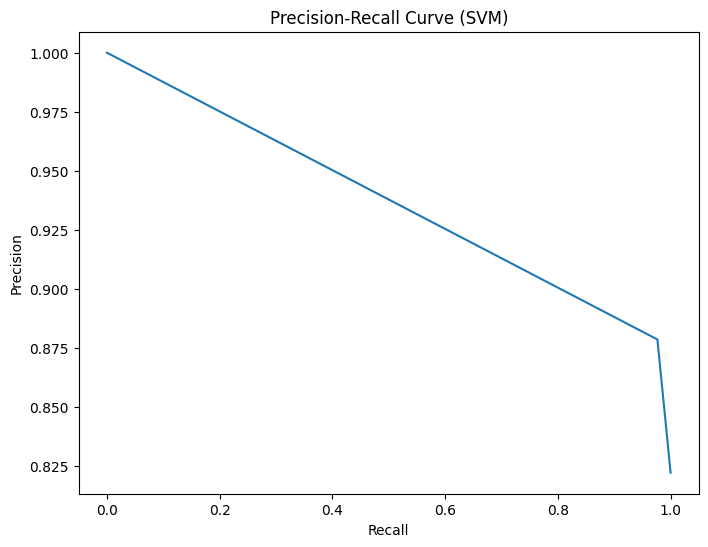

In [34]:
#create a precision recall curve
precision, recall, thresholds = precision_recall_curve(y_test_binary, svm_model_y_pred)

#plot the precision recall curve
plt.figure(figsize=(8, 6))
plt.plot(recall, precision)
plt.title('Precision-Recall Curve (SVM)')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.show()

In [35]:
#create the logistic log_reg_model and fit the training data 
log_reg_model = LogisticRegression()
log_reg_model.fit(X_train_vector_bin, y_train_binary)

#predict the label for testing data 
log_reg_y_pred = log_reg_model.predict(X_test_vector_bin)

#evaluate the performance of the log_reg_model through report 
print(f'Logistic Regression Report ')
print(classification_report(y_test_binary, log_reg_y_pred))


Logistic Regression Report 
              precision    recall  f1-score   support

           0       0.73      0.39      0.50      1638
           1       0.88      0.97      0.92      7566

    accuracy                           0.86      9204
   macro avg       0.80      0.68      0.71      9204
weighted avg       0.85      0.86      0.85      9204



/Users/jc/Library/Python/3.9/lib/python/site-packages/sklearn/linear_model/_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


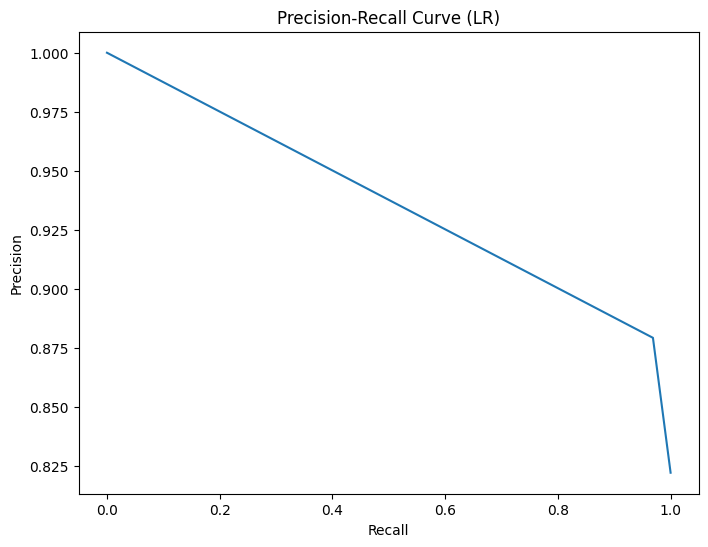

In [36]:
#create a precision recall curve to compare with SVM 
precision, recall, thresholds = precision_recall_curve(y_test_binary, log_reg_y_pred)

#plot the precision recall curve
plt.figure(figsize=(8, 6))
plt.plot(recall, precision)
plt.title('Precision-Recall Curve (LR)')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.show()